**Single Image test on NIDS with Sliding window**

In [1]:
# demo_eval_gdino_FFA.py
import time
import argparse
import cv2
import glob
import json
import logging
import os
import sys
import random
import numpy as np
import matplotlib.pyplot as plt
from typing import List, Optional
import torch
from torch import nn
import torch.backends.cudnn as cudnn
from torchvision import transforms as pth_transforms
import torchvision.transforms as T
from detectron2.data import DatasetCatalog, MetadataCatalog
from detectron2.data.datasets import register_coco_instances
from utils.visualizer import ColorMode, Visualizer
from utils.instance_det_dataset import RealWorldDataset
from utils.inference_utils import compute_similarity, stableMatching, getColor, create_instances, nms, apply_nms, get_features
from tqdm import trange
from adapter import ModifiedClipAdapter, WeightAdapter
from utils.img_utils import get_masked_image
import cv2
from typing import Dict, List, Optional, Sequence, Tuple, Union
import numpy as np
from PIL import Image
import time
from absl import app, logging
from PIL import Image as PILImg
from PIL import ImageFilter
import PIL.ImageOps
from robokit.utils import overlay_masks
from robokit.ObjDetection import GroundingDINOObjectPredictor, SegmentAnythingPredictor
import torch
import supervision as sv
import tqdm as tqdm
from utils.img_utils import masks_to_bboxes
from pycocotools import mask as maskUtils
from utils.data_utils import gen_square_crops
from utils.sliding_window import slice_image, get_slice_bboxes
from utils.changed_fn import area, annotate, get_object_proposal

sys.path.append("../detectron2")
sys.path.append(".")

In [2]:
# In[10]:
# Path to the input image
imsize = 448
tag = "mask"  # bbox
img_id = 39
image_path = "test_data/test_1/test_"+str(img_id).zfill(3)+".jpg" # << Since single image eval so load that image
test_path = "test_data/test_1/test_"+str(img_id).zfill(3)+".jpg"
output_dir = "exps/demo0501_" + str(imsize) + "_" + tag

image_pil = PILImg.open(image_path).convert("RGB") # Read Img
wd, ht = image_pil.size

if wd!=8192 and ht!=6144:
    image_pil = PILImg.open(image_path).convert("RGB").resize(((8192//4)*2, (6144//4)*2), PIL.Image.BILINEAR) # Read Img

    image = Image.new(image_pil.mode, (8192, 6144), (225, 225, 255))
    image.paste(image_pil, (8192//4, 6144//4)) 

    # image = PILImg.open(image_path).convert("RGB").resize((8192, 6144), PIL.Image.NEAREST) # Read Img
else:
    image=image_pil

width, height = image.size # Get size of Image
slice_height = height // 2
slice_width = width // 2
overlap_ratio_h=0.2
overlap_ratio_w=0.2

slice_image_result = slice_image(
            image=image,
            slice_height=slice_height,
            slice_width=slice_width,
            overlap_height_ratio=overlap_ratio_h,
            overlap_width_ratio=overlap_ratio_w,
            auto_slice_resolution=False,
        )

all_windows = get_slice_bboxes(
        image_height=height,
        image_width=width,
        slice_height=slice_height,
        slice_width=slice_width,
        auto_slice_resolution=False,
        overlap_height_ratio=overlap_ratio_h,
        overlap_width_ratio=overlap_ratio_w
    )

number_of_tiles = len(slice_image_result)
print(f"{number_of_tiles} Tiles are created for the image")

16 Tiles are created for the image


In [3]:
gdino = GroundingDINOObjectPredictor(use_vitb=False, box_threshold=0.2, text_threshold=0.2)
SAM = SegmentAnythingPredictor(vit_model="vit_h") 
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
encoder = torch.hub.load('facebookresearch/dinov2', 'dinov2_vitl14_reg').to(device).eval()

final text_encoder_type: bert-base-uncased
Model loaded from C:\Users\divya\.cache\huggingface\hub\models--ShilongLiu--GroundingDINO\snapshots\a94c9b567a2a374598f05c584e96798a170c56fb\groundingdino_swint_ogc.pth 
 => _IncompatibleKeys(missing_keys=[], unexpected_keys=['label_enc.weight', 'bert.embeddings.position_ids'])


Using cache found in C:\Users\divya/.cache\torch\hub\facebookresearch_dinov2_main
INFO:dinov2:using MLP layer as FFN


In [4]:
scene_features = []
proposals = []
text_prompt = 'objects'
start_time = time.time()
threshold = 30

for i, image_slice in enumerate(slice_image_result):

    window = PILImg.fromarray(image_slice['image'])
    start_x, start_y = image_slice['starting_pixel']
    bboxes, phrases, gdino_conf = gdino.predict(window, text_prompt)
    w, h = window.size
    xyxy = gdino.bbox_to_scaled_xyxy(bboxes, w, h).detach().cpu().numpy()
    print(f"Window: {i} \nGdino bbox's: {xyxy.shape=}")
    # xyxy, masks = SAM.predict(window, xyxy)
    confs = gdino_conf.detach().cpu().numpy()
    torch.cuda.empty_cache()

    window_bboxs=[]
    
    # Threshold Check for bbox
    for k in trange(len(xyxy)):
        x1, y1, x2, y2 = xyxy[k]

        s=area([x1, y1, x2, y2])
        b=area(all_windows[i])
        if int((s/b)*100)>threshold:
            continue
        window_bboxs.append([x1, y1, x2, y2])
      
    # Skipping Windows 
    if len(window_bboxs)==0:
        print(f"Skipping this Window {i} as {len(window_bboxs)=} Bbox'x left after threshold")
        print("==============================================================================================================================")
        continue

    print(f"After threshold >> {len(window_bboxs)} Bbox's left")
    _, masks = SAM.predict(window, np.array(window_bboxs))
    masks = masks.squeeze(1)
    accurate_bboxs = masks_to_bboxes(masks)
    accurate_bboxs = torch.tensor(accurate_bboxs).cpu().numpy()
    masks=masks.cpu().numpy()
    print(f"SAM output >> Accurate Bbox's Shape: {accurate_bboxs.shape} || masks Shape: {masks.shape}")

    ratio=0.25        
    rois, sel_rois, cropped_imgs, cropped_masks = get_object_proposal(image_path, image_slice['image'], accurate_bboxs, masks, tag=tag, ratio=ratio, save_rois=False, output_dir=output_dir, save_proposal=False)

    # rescaling bbox's
    for _ in trange(len(sel_rois)):

        # For 1/4 Scale
        x1, y1, x2, y2 = accurate_bboxs[_]
        sel_rois[_]['bbox'] = [int((x1+start_x)*ratio), int((y1+start_y)*ratio), int((x2+start_x)*ratio)-int((x1+start_x)*ratio),  int((y2+start_y)*ratio)-int((y1+start_y)*ratio)]
        # print([int((x1+start_x)), int((y1+start_y)), int((x2+start_x)),  int((y2+start_y))])
        # For 1 Scale
        # x1, y1, x2, y2 = accurate_bboxs[_]
        # sel_rois[_]['bbox'] = [int(x1+start_x), int(y1+start_y), int(x2+start_x)-int(x1+start_x),  int(y2+start_y)-int(y1+start_y)]
        
    
    proposals.extend(sel_rois)

    # Visualization 
    # fig, ax = plt.subplots(len(cropped_imgs), 2, figsize=(len(cropped_imgs)*10, 20))
    # if len(cropped_imgs)==1:
    #     ax[0].imshow(cropped_imgs[0])
    #     ax[1].imshow(cropped_masks[0])
    # else:
    #     for i in range(len(cropped_imgs)):
    #         ax[i, 0].imshow(cropped_imgs[i])
    #         ax[i, 1].imshow(cropped_masks[i])
    
    # plt.tight_layout()
    # plt.show()
    # plt.close()

    print(f"Object Proposal output >> croped imgs: {len(cropped_imgs)} || cropped masks: {len(cropped_masks)}")
    for j in trange(len(cropped_imgs)):
        img = cropped_imgs[j]
        mask = cropped_masks[j]
        ffa_feature= get_features([img], [mask], encoder, device=device, img_size=imsize)
        scene_features.append(ffa_feature)
    
    print(f"scene features after window {i}: {len(scene_features)}")
    print(f"Proposals after window {i}: {len(proposals)}")
    print("==============================================================================================================================")

end_time = time.time()
print(f"scene features: {len(scene_features)} and each of shape: {scene_features[0].shape}")
print(f"Total running time: {end_time - start_time} seconds")

Window: 0 
Gdino bbox's: xyxy.shape=(4, 4)


100%|██████████| 4/4 [00:00<00:00, 7887.74it/s]

After threshold >> 2 Bbox's left


SAM output >> Accurate Bbox's Shape: (2, 4) || masks Shape: (2, 2048, 2730)


100%|██████████| 2/2 [00:00<00:00, 1576.81it/s]


Object Proposal output >> croped imgs: 2 || cropped masks: 2


100%|██████████| 2/2 [00:00<00:00,  6.74it/s]


scene features after window 0: 2
Proposals after window 0: 2
Window: 1 
Gdino bbox's: xyxy.shape=(4, 4)


100%|██████████| 4/4 [00:00<00:00, 3984.14it/s]


After threshold >> 1 Bbox's left
SAM output >> Accurate Bbox's Shape: (1, 4) || masks Shape: (1, 2048, 2730)


100%|██████████| 1/1 [00:00<?, ?it/s]


Object Proposal output >> croped imgs: 1 || cropped masks: 1


100%|██████████| 1/1 [00:00<00:00, 12.05it/s]


scene features after window 1: 3
Proposals after window 1: 3
Window: 2 
Gdino bbox's: xyxy.shape=(3, 4)


100%|██████████| 3/3 [00:00<00:00, 3001.65it/s]


After threshold >> 1 Bbox's left
SAM output >> Accurate Bbox's Shape: (1, 4) || masks Shape: (1, 2048, 2730)


100%|██████████| 1/1 [00:00<00:00, 993.68it/s]


Object Proposal output >> croped imgs: 1 || cropped masks: 1


100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


scene features after window 2: 4
Proposals after window 2: 4
Window: 3 
Gdino bbox's: xyxy.shape=(5, 4)


100%|██████████| 5/5 [00:00<?, ?it/s]


After threshold >> 3 Bbox's left
SAM output >> Accurate Bbox's Shape: (3, 4) || masks Shape: (3, 2048, 2730)


100%|██████████| 3/3 [00:00<00:00, 1503.16it/s]


Object Proposal output >> croped imgs: 3 || cropped masks: 3


100%|██████████| 3/3 [00:00<00:00,  6.27it/s]


scene features after window 3: 7
Proposals after window 3: 7
Window: 4 
Gdino bbox's: xyxy.shape=(11, 4)


100%|██████████| 11/11 [00:00<?, ?it/s]


After threshold >> 11 Bbox's left
SAM output >> Accurate Bbox's Shape: (11, 4) || masks Shape: (11, 2048, 2730)


100%|██████████| 11/11 [00:00<00:00, 5520.80it/s]


Object Proposal output >> croped imgs: 11 || cropped masks: 11


100%|██████████| 11/11 [00:02<00:00,  5.38it/s]


scene features after window 4: 18
Proposals after window 4: 18
Window: 5 
Gdino bbox's: xyxy.shape=(30, 4)


100%|██████████| 30/30 [00:00<00:00, 30016.49it/s]


After threshold >> 29 Bbox's left
SAM output >> Accurate Bbox's Shape: (29, 4) || masks Shape: (29, 2048, 2730)


100%|██████████| 29/29 [00:00<00:00, 8458.02it/s]


Object Proposal output >> croped imgs: 29 || cropped masks: 29


100%|██████████| 29/29 [00:05<00:00,  5.39it/s]


scene features after window 5: 47
Proposals after window 5: 47
Window: 6 
Gdino bbox's: xyxy.shape=(11, 4)


100%|██████████| 11/11 [00:00<00:00, 11125.47it/s]


After threshold >> 11 Bbox's left
SAM output >> Accurate Bbox's Shape: (11, 4) || masks Shape: (11, 2048, 2730)


100%|██████████| 11/11 [00:00<00:00, 3666.35it/s]


Object Proposal output >> croped imgs: 11 || cropped masks: 11


100%|██████████| 11/11 [00:02<00:00,  5.35it/s]


scene features after window 6: 58
Proposals after window 6: 58
Window: 7 
Gdino bbox's: xyxy.shape=(8, 4)


100%|██████████| 8/8 [00:00<00:00, 4040.27it/s]

After threshold >> 8 Bbox's left


SAM output >> Accurate Bbox's Shape: (8, 4) || masks Shape: (8, 2048, 2730)


100%|██████████| 8/8 [00:00<00:00, 7968.28it/s]


Object Proposal output >> croped imgs: 8 || cropped masks: 8


100%|██████████| 8/8 [00:01<00:00,  5.09it/s]


scene features after window 7: 66
Proposals after window 7: 66
Window: 8 
Gdino bbox's: xyxy.shape=(9, 4)


100%|██████████| 9/9 [00:00<00:00, 9320.68it/s]


After threshold >> 9 Bbox's left
SAM output >> Accurate Bbox's Shape: (9, 4) || masks Shape: (9, 2048, 2730)


100%|██████████| 9/9 [00:00<00:00, 9058.97it/s]


Object Proposal output >> croped imgs: 9 || cropped masks: 9


100%|██████████| 9/9 [00:01<00:00,  5.62it/s]


scene features after window 8: 75
Proposals after window 8: 75
Window: 9 
Gdino bbox's: xyxy.shape=(16, 4)


100%|██████████| 16/16 [00:00<00:00, 16950.96it/s]


After threshold >> 16 Bbox's left
SAM output >> Accurate Bbox's Shape: (16, 4) || masks Shape: (16, 2048, 2730)


100%|██████████| 16/16 [00:00<00:00, 15944.13it/s]


Object Proposal output >> croped imgs: 16 || cropped masks: 16


100%|██████████| 16/16 [00:03<00:00,  5.33it/s]


scene features after window 9: 91
Proposals after window 9: 91
Window: 10 
Gdino bbox's: xyxy.shape=(6, 4)


100%|██████████| 6/6 [00:00<?, ?it/s]


After threshold >> 6 Bbox's left
SAM output >> Accurate Bbox's Shape: (6, 4) || masks Shape: (6, 2048, 2730)


100%|██████████| 6/6 [00:00<?, ?it/s]


Object Proposal output >> croped imgs: 6 || cropped masks: 6


100%|██████████| 6/6 [00:01<00:00,  5.50it/s]


scene features after window 10: 97
Proposals after window 10: 97
Window: 11 
Gdino bbox's: xyxy.shape=(5, 4)


100%|██████████| 5/5 [00:00<00:00, 5031.55it/s]


After threshold >> 4 Bbox's left
SAM output >> Accurate Bbox's Shape: (4, 4) || masks Shape: (4, 2048, 2730)


100%|██████████| 4/4 [00:00<00:00, 3994.58it/s]


Object Proposal output >> croped imgs: 4 || cropped masks: 4


100%|██████████| 4/4 [00:00<00:00,  5.54it/s]


scene features after window 11: 101
Proposals after window 11: 101
Window: 12 
Gdino bbox's: xyxy.shape=(4, 4)


100%|██████████| 4/4 [00:00<?, ?it/s]


After threshold >> 1 Bbox's left
SAM output >> Accurate Bbox's Shape: (1, 4) || masks Shape: (1, 2048, 2730)


100%|██████████| 1/1 [00:00<?, ?it/s]


Object Proposal output >> croped imgs: 1 || cropped masks: 1


100%|██████████| 1/1 [00:00<00:00,  6.80it/s]


scene features after window 12: 102
Proposals after window 12: 102
Window: 13 
Gdino bbox's: xyxy.shape=(5, 4)


100%|██████████| 5/5 [00:00<00:00, 4984.91it/s]


After threshold >> 1 Bbox's left
SAM output >> Accurate Bbox's Shape: (1, 4) || masks Shape: (1, 2048, 2730)


100%|██████████| 1/1 [00:00<00:00, 510.88it/s]


Object Proposal output >> croped imgs: 1 || cropped masks: 1


100%|██████████| 1/1 [00:00<00:00,  7.14it/s]


scene features after window 13: 103
Proposals after window 13: 103
Window: 14 
Gdino bbox's: xyxy.shape=(4, 4)


100%|██████████| 4/4 [00:00<00:00, 4192.21it/s]


After threshold >> 1 Bbox's left
SAM output >> Accurate Bbox's Shape: (1, 4) || masks Shape: (1, 2048, 2730)


100%|██████████| 1/1 [00:00<00:00, 514.39it/s]


Object Proposal output >> croped imgs: 1 || cropped masks: 1


100%|██████████| 1/1 [00:00<00:00,  9.35it/s]

scene features after window 14: 104
Proposals after window 14: 104


Window: 15 
Gdino bbox's: xyxy.shape=(4, 4)


100%|██████████| 4/4 [00:00<?, ?it/s]


After threshold >> 2 Bbox's left
SAM output >> Accurate Bbox's Shape: (2, 4) || masks Shape: (2, 2048, 2730)


100%|██████████| 2/2 [00:00<00:00, 2013.10it/s]


Object Proposal output >> croped imgs: 2 || cropped masks: 2


100%|██████████| 2/2 [00:00<00:00,  5.50it/s]

scene features after window 15: 106
Proposals after window 15: 106
scene features: 106 and each of shape: torch.Size([1, 1024])
Total running time: 112.73763942718506 seconds


In [5]:
for i, e in enumerate(proposals):
    # For 1 Scale
    # e['roi_id'] = i
    # e['scale'] = 1
    # e['image_height']=height
    # e['image_width']=width

    # For 1/4 Scale
    e['roi_id'] = i
    e['scale'] = 4
    e['image_height']=height//4
    e['image_width']=width//4
proposals

[{'roi_id': 0,
  'image_id': 39,
  'bbox': [0, 1, 222, 434],
  'area': 1466786,
  'roi_dir': 'exps/demo0501_448_mask\\test_039\\test_039_000.png',
  'image_dir': 'test_data/test_1/test_039.jpg',
  'image_width': 2048,
  'image_height': 1536,
  'scale': 4},
 {'roi_id': 1,
  'image_id': 39,
  'bbox': [511, 1, 171, 419],
  'area': 1089810,
  'roi_dir': 'exps/demo0501_448_mask\\test_039\\test_039_001.png',
  'image_dir': 'test_data/test_1/test_039.jpg',
  'image_width': 2048,
  'image_height': 1536,
  'scale': 4},
 {'roi_id': 2,
  'image_id': 39,
  'bbox': [929, 474, 135, 37],
  'area': 74264,
  'roi_dir': 'exps/demo0501_448_mask\\test_039\\test_039_000.png',
  'image_dir': 'test_data/test_1/test_039.jpg',
  'image_width': 2048,
  'image_height': 1536,
  'scale': 4},
 {'roi_id': 3,
  'image_id': 39,
  'bbox': [1517, 1, 257, 388],
  'area': 1554840,
  'roi_dir': 'exps/demo0501_448_mask\\test_039\\test_039_000.png',
  'image_dir': 'test_data/test_1/test_039.jpg',
  'image_width': 2048,
  'im

In [6]:
scene_name_list = []
scene_name = os.path.basename(image_path).split('.')[0]
scene_name_list.append(scene_name)

scene_features = torch.cat(scene_features, dim=0)
scene_features = nn.functional.normalize(scene_features, dim=1, p=2)

print("proposals (sel_rois): ", len(proposals))

output_dir = 'D:/CODE/NIDS-Net/feats'
json_filename = 'high_resolution_object_features_vitl14_reg.json'
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

with open(os.path.join(output_dir, json_filename), 'r') as f:
    feat_dict = json.load(f)

object_features = torch.Tensor(feat_dict['features']).to(device)
object_features = nn.functional.normalize(object_features, dim=1, p=2)

print("scene features: ", scene_features.shape) # Shape (n, 1024)
print("object_features: ", object_features.shape) # Shape (2400, 1024)

proposals (sel_rois):  106
scene features:  torch.Size([106, 1024])
object_features:  torch.Size([2400, 1024])


In [7]:
num_object = 100 # len(object_dataset.cfg['obj_name'])
# Reduce this num_example value and find out which is the minimum no. of image instances that can be used without reducing the accuracy of the architecture. 
num_example = len(object_features) // num_object # 24 each object instances 

sim_mat = compute_similarity(object_features, scene_features)
sim_mat = sim_mat.view(len(scene_features), num_object, num_example)
sims, _ = torch.max(sim_mat, dim=2)  # choose max score over profile examples of each object instance
sims = sims.view(len(scene_features), num_object)
max_ins_sim, initial_result = torch.max(sims, dim=1)

proposals = proposals
num_proposals = len(proposals)
print("Similarity Matrix: ", sims.shape) # (n, 100)

Similarity Matrix:  torch.Size([106, 100])


In [8]:
# TODO 1: Rewite Matching script 
# TODO 2: Find best threshold THRESHOLD_OBJECT_SCORE value
results = []


########################################## Stable Matching Strategy ##########################################
do_matching = False
if do_matching:
    
    # ------------ ranking and sorting ------------
    # Initialization
    sel_obj_ids = [str(v) for v in list(np.arange(num_object))]  # ids for selected obj
    sel_roi_ids = [str(v) for v in list(np.arange(len(scene_features)))]  # ids for selected roi
    print(f"{len(sel_obj_ids)} || {len(sel_roi_ids)}")
    # Padding
    # max_len = max(len(sel_roi_ids), len(sel_obj_ids)) # l = max(n-1, 99)
    sel_sims_symmetric = torch.ones((len(sel_roi_ids), len(sel_obj_ids))) * -1  # Create a l * l matrix filled with -1 
    sel_sims_symmetric[:len(sel_roi_ids), :len(sel_obj_ids)] = sims.clone() # clone the sims matrix into this new created matrix
    # len(sel_roi_ids)=n || len(sel_obj_ids)=100
    print(f"{sel_sims_symmetric.shape}")
    """
    if n=98
    sims.shape=(98,100)
    len(sel_roi_ids)=98 < len(sel_obj_ids)=100
    max_len=100
    sel_sims_symmetric.shape=(100,100)  >>>>> (98,100)
    sel_sims_symmetric[:98, :100] = sims.clone() # last 2 rows empty
    
    
    ~pad_len = 2
    ~pad_roi_ids = [98,99] # for i from 98 to 100 # created extra rois which doesnt exists for "padding"
    
    
    len(sel_roi_ids)=100 
    matchedMat.shape=(100,100) # scores for obj * roi   >>>>> (98,100)
    predMat_row.shape=(100,100) # all zero's array      >>>>> (98,100)
    Matches = {} len(items of matches)=100 >>>>> THis has changed to 98 
    for i in 0-100 this is on roi dim
        tmp=[0,:] # get all the 100 object scores for single roi in tmp
        a = argmax(tmp) # a contains the index of the max score object 
        predMat_row[0,a] = tmp[a] # store the obj id in predMat at roi_id X a (i.e the obj_id)
        Store this tuple (roi_id,a) in Matches        

    """
    
    # pad_len = abs(len(sel_roi_ids) - len(sel_obj_ids))
    # if len(sel_roi_ids) > len(sel_obj_ids):
    #     pad_obj_ids = [str(i) for i in range(num_object, num_object + pad_len)]
    #     sel_obj_ids += pad_obj_ids
    # elif len(sel_roi_ids) < len(sel_obj_ids):
    #     pad_roi_ids = [str(i) for i in range(len(sel_roi_ids), len(sel_roi_ids) + pad_len)]
    #     sel_roi_ids += pad_roi_ids

    # ------------ stable matching ------------
    matchedMat = stableMatching(sel_sims_symmetric.detach().data.cpu().numpy())  # predMat is raw predMat
    
    predMat_row = np.zeros_like(sel_sims_symmetric.detach().data.cpu().numpy())  # predMat_row is the result after stable matching
    
    print(f"{matchedMat.shape=}")

    Matches = dict()
    for i in range(matchedMat.shape[0]):
        tmp = matchedMat[i, :]
        a = tmp.argmax()
        predMat_row[i, a] = tmp[a]
        Matches[sel_roi_ids[i]] = sel_obj_ids[int(a)]
    print("Stable Matching Done!")
    print(f"{predMat_row.shape=}, {len(Matches.items())}")
    # ------------ thresholding ------------
    preds = Matches.copy()

    # ------------ save per scene results ------------
    for i, (k, v) in enumerate(preds.items()): # K is my roi id and v is my obj id 
        if int(k) >= num_proposals:  # since the number of proposals is less than the number of object features
            break
        result = dict()
        result['image_id'] = proposals[int(k)]['image_id']
        result['category_id'] = int(v)
        result['bbox'] = proposals[int(k)]['bbox']
        result['area'] = proposals[int(k)]['area']
        result['score'] = float(sims[int(k), int(v)])
        result['image_width'] = proposals[int(k)]['image_width']
        result['image_height'] = proposals[int(k)]['image_height']
        result['scale'] = proposals[int(k)]['scale']
        results.append(result)

else:
    THRESHOLD_OBJECT_SCORE = 0.6
    for i in range(num_proposals):
        if float(max_ins_sim[i]) < THRESHOLD_OBJECT_SCORE:
            continue
        result = dict()
        result['image_id'] = proposals[i]['image_id']
        result['category_id'] = initial_result[i].item()
        result['bbox'] = proposals[i]['bbox']
        result['area'] = proposals[i]['area']
        result['score'] = float(max_ins_sim[i])
        result['image_width'] = proposals[i]['image_width']
        result['image_height'] = proposals[i]['image_height']
        result['scale'] = proposals[i]['scale']
        results.append(result)
    # print("Done!")
print("Objects Matched: ",len(results))
results

Objects Matched:  67


[{'image_id': 39,
  'category_id': 28,
  'bbox': [429, 742, 121, 163],
  'area': 247753,
  'score': 0.6183418035507202,
  'image_width': 2048,
  'image_height': 1536,
  'scale': 4},
 {'image_id': 39,
  'category_id': 94,
  'bbox': [119, 779, 37, 116],
  'area': 50887,
  'score': 0.7024652361869812,
  'image_width': 2048,
  'image_height': 1536,
  'scale': 4},
 {'image_id': 39,
  'category_id': 94,
  'bbox': [72, 777, 39, 119],
  'area': 54441,
  'score': 0.7597451210021973,
  'image_width': 2048,
  'image_height': 1536,
  'scale': 4},
 {'image_id': 39,
  'category_id': 99,
  'bbox': [617, 843, 59, 72],
  'area': 64223,
  'score': 0.6562344431877136,
  'image_width': 2048,
  'image_height': 1536,
  'scale': 4},
 {'image_id': 39,
  'category_id': 99,
  'bbox': [550, 842, 60, 68],
  'area': 58786,
  'score': 0.6449809074401855,
  'image_width': 2048,
  'image_height': 1536,
  'scale': 4},
 {'image_id': 39,
  'category_id': 28,
  'bbox': [574, 768, 47, 79],
  'area': 42015,
  'score': 0.62

In [10]:
# ### Save Results

# In[8]:
# save final results
with open(os.path.join("coco_instances_results.json"), "w") as f:
    json.dump(results, f)

predictions = dict(
    [(k, {'image_id': -1, 'instances': []}) for k in range(len(scene_name_list))])


for idx in range(len(results)):
    id = results[idx]['image_id']
    predictions[scene_name_list.index('test_' + str(id).zfill(3))]['image_id'] = id

    predictions[scene_name_list.index('test_' + str(id).zfill(3))]['instances'].append(results[idx])

torch.save(predictions, os.path.join("instances_predictions.pth"))
print('Saved instances_predictions.pth')

# ### Visualization
# Random custom colors with a fixed random seed
random.seed(77)
thing_colors = []
for i in range(100):
    thing_colors.append(getColor())

# In[10]:
# Register Test Data for COCO evaluation
test_path = "./test_data/test_4" # 1 for raw data, 2 for ratio=0.5, 4 for ratio=0.25, 8 for ratio=0.125  # test_4
# test_json = "./test_data/annotations/instances_test_4.json"  # instances_test_4
test_json = "./test_data/annotations/single_image_ground_truth_"+str(img_id)+".json"  # instances_test_4
register_coco_instances("coco_InsDet_test_21", {}, test_json, test_path)
MetadataCatalog.get("coco_InsDet_test_21").thing_colors = thing_colors

# In[11]:
pred_dir = os.path.join(output_dir,"predictions")
os.makedirs(pred_dir, exist_ok=True)
test_metadata = MetadataCatalog.get("coco_InsDet_test_21")
test_dataset_dicts = DatasetCatalog.get("coco_InsDet_test_21")

idx = scene_name_list.index(scene_name)
# d = test_dataset_dicts[int(scene_name.split('_')[-1])]
d = test_dataset_dicts[0] # idx
img = cv2.imread(d["file_name"])
base_name = os.path.basename(d["file_name"]).split(".")[0]

# visualize GT
visGT = Visualizer(img[:, :, ::-1],
                   metadata=test_metadata,
                   scale=1.0,
                   instance_mode=ColorMode.SEGMENTATION)
vis_gt = visGT.draw_dataset_dict(d)
cv2.imwrite(os.path.join(pred_dir, base_name + "_gt.jpg"),
            vis_gt.get_image()[:, :, ::-1])

visPred = Visualizer(img[:, :, ::-1],
                     metadata=test_metadata,
                     scale=1.0,
                     instance_mode=ColorMode.SEGMENTATION)

# visualize pred
# predictions = torch.load(os.path.join(args.output_dir, "instances_predictions.pth"))
pred = create_instances(predictions[idx]['instances'], img.shape[:2], test_metadata)
keep_ids = apply_nms(pred)  # apply NMS

vis_pred = visPred.draw_instance_predictions(pred.to("cpu"), keep_ids)
cv2.imwrite(os.path.join(pred_dir, base_name + "_pred_SAM+DINOv2.jpg"),
            vis_pred.get_image()[:, :, ::-1])

# =================================================================================================================
# Evaluation Result for single image

from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval

# Load the ground truth COCO dataset
cocoGt = COCO('test_data/annotations/single_image_ground_truth_'+str(img_id)+'.json')

# Load your detection results
cocoDt = cocoGt.loadRes(os.path.join("coco_instances_results.json"))

# Create a COCOeval object by initializing it with the ground truth and detection results
cocoEval = COCOeval(cocoGt, cocoDt, 'bbox')

# Run the evaluation
cocoEval.evaluate()
cocoEval.accumulate()
cocoEval.summarize()

# 'bbox' specifies that we are doing evaluation for bounding box detection.
# You can change it to 'segm' for segmentation tasks.


INFO:detectron2.data.datasets.coco:Loaded 1 images in COCO format from ./test_data/annotations/single_image_ground_truth_39.json


Saved instances_predictions.pth
	 38
	 34
	 32
	 65
	 39
	 35
	 60
	 30
	 50
	 31
	 37
	 61
	 52
	 49
	 45
	 51
	 3
	 13
	 66
	 4
	 46
	 48
	 29
	 25
	 59
	 28
	 43
	 54
	 44
	 57
	 15
	 27
	 58
	 47
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.02s).
Accumulating evaluation results...
DONE (t=0.16s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.577
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.675
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.596
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.900
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.609
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.098
 Average Recall     (AR) 

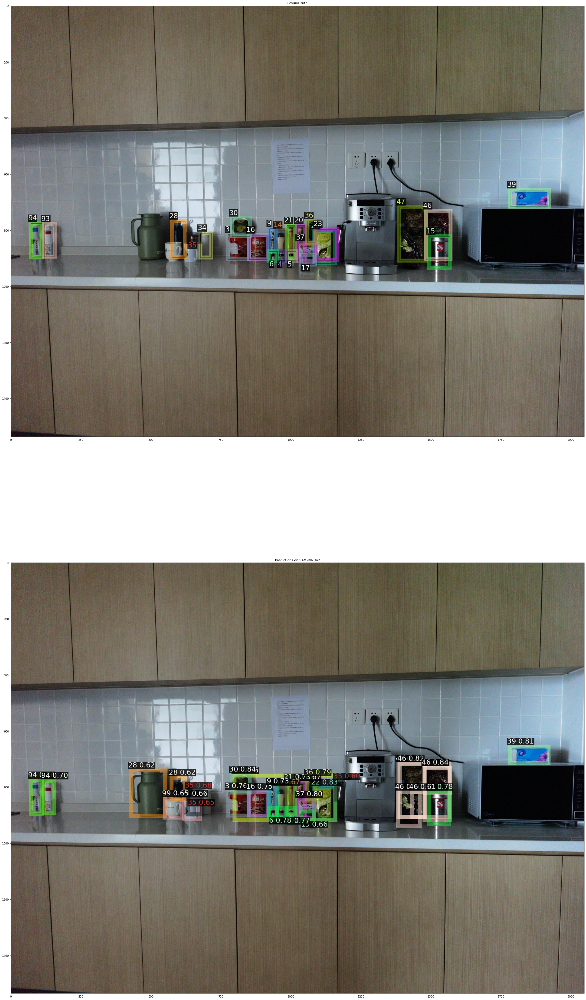

In [11]:
# In[12]:
fig = plt.figure(figsize=(30,60), dpi=64, facecolor='w', edgecolor='k')
ax = plt.subplot(211)
ax.set_title("GroundTruth")
plt.imshow(vis_gt.get_image()[:, :, :])
ax = plt.subplot(212)
ax.set_title("Predictions on SAM-DINOv2")
plt.imshow(vis_pred.get_image()[:, :, :])
plt.tight_layout()
# plt.savefig('./result_images/InsDet/'+base_name+'_SAM_DINOv2.png', dpi=300)
plt.show()

In [12]:
final_boxes=[]
for p in proposals:
    x1,y1,x2,y2 = p['bbox']
    final_boxes.append([ x1*4, y1*4, x1*4+x2*4, y1*4+y2*4])
final_boxes

[[0, 4, 888, 1740],
 [2044, 4, 2728, 1680],
 [3716, 1896, 4256, 2044],
 [6068, 4, 7096, 1556],
 [7552, 4, 8188, 1500],
 [5460, 4, 6084, 1576],
 [5460, 1504, 8188, 2040],
 [1716, 2968, 2200, 3620],
 [476, 3116, 624, 3580],
 [288, 3108, 444, 3584],
 [2468, 3372, 2704, 3660],
 [2200, 3368, 2440, 3640],
 [2296, 3072, 2484, 3580],
 [2296, 3072, 2484, 3388],
 [2528, 3256, 2728, 3588],
 [2528, 3256, 2708, 3380],
 [0, 3552, 132, 3604],
 [2448, 3052, 2604, 3372],
 [4328, 3212, 4628, 3672],
 [3400, 3272, 3668, 3612],
 [3160, 3028, 3412, 3284],
 [3100, 3264, 3396, 3612],
 [2468, 3372, 2704, 3660],
 [2300, 3072, 2484, 3580],
 [2200, 3364, 2440, 3640],
 [4756, 2684, 4912, 3680],
 [2708, 3240, 2860, 3592],
 [3940, 3136, 4056, 3584],
 [4148, 3552, 4332, 3684],
 [3688, 3196, 3800, 3636],
 [4232, 3068, 4340, 3376],
 [3788, 3208, 3920, 3596],
 [4088, 3136, 4200, 3636],
 [3696, 3196, 3776, 3504],
 [4648, 3124, 4748, 3384],
 [3688, 3500, 3804, 3636],
 [3716, 1900, 4272, 2680],
 [3808, 3500, 3928, 3636],
 

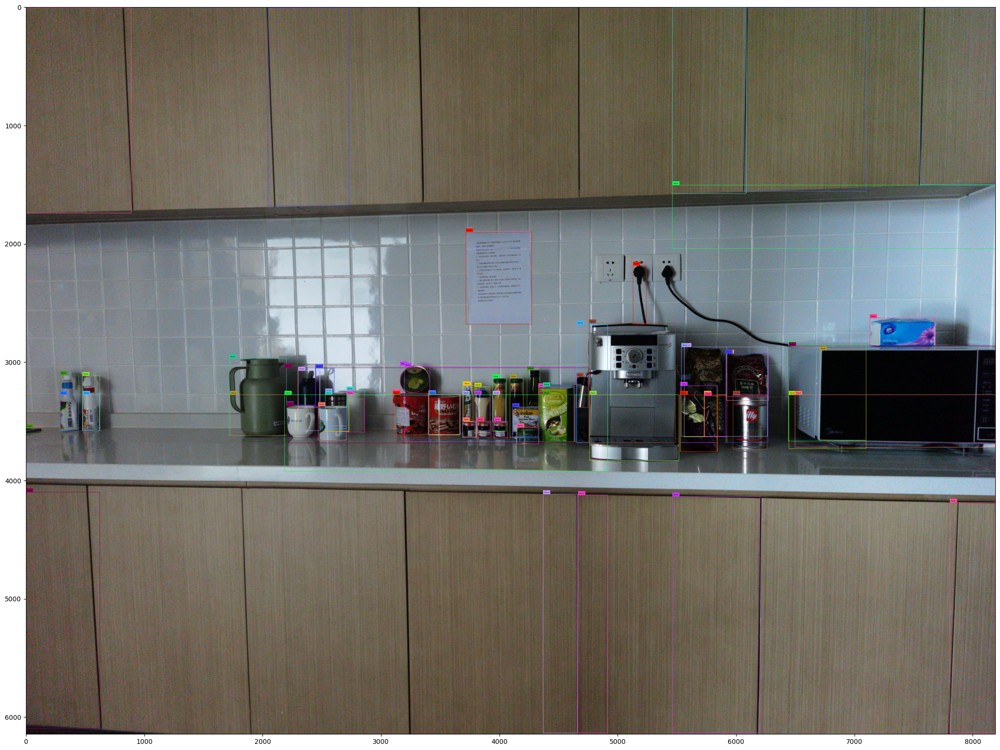

In [13]:
import matplotlib.pyplot as plt

def plot_boxes(image_source, boxes):
    """
    Annotate image with bounding boxes, logits, and phrases.

    Parameters:
    - image_source (PIL.Image.Image): Input image source.
    - boxes (torch.tensor): Bounding boxes in xyxy format.
    - logits (list): List of confidence logits.
    - phrases (list): List of phrases.

    Returns:
    - PIL.Image: Annotated image.
    """
    try:
        detections = sv.Detections(xyxy=np.array(boxes))
        box_annotator = sv.BoxAnnotator(thickness=2)
        img_pil = PILImg.fromarray(box_annotator.annotate(scene=np.array(image_source), detections=detections))
        return img_pil
    
    except Exception as e:
        logging.error(f"Error during annotation: {e}")
        raise e
    
bbox_annotated_pil = plot_boxes(image, final_boxes)
# bbox_annotated_pil.show()
plt.figure(figsize=(50,20))
plt.imshow(bbox_annotated_pil)